In [2]:
from konlpy.tag import Okt
import pandas as pd

In [3]:
# 파일, 불러오기
file_path="C:/Users/user/Desktop/saltlux_project/data/review_file_junrang.xlsx" 
df = pd.read_excel(file_path)
df

,name,content,sentiment
0,365mc모인이비인후과의원,사가정 모인 이비인후과 항상 만원이다,0
1,365mc모인이비인후과의원,좋아요,1
2,365mc모인이비인후과의원,좋아요,1
3,365mc모인이비인후과의원,항상 친절한 진료 감사합니다~,1
4,365mc모인이비인후과의원,ㅇㅇ,1
...,...,...,...
5968,효치과의원,굳,1
5969,효치과의원,좋아요,1
5970,효치과의원,친절하십니다_x000D_\n과잉진료 없음,1
5971,효치과의원,친절해요..,1


In [4]:
# 결측값 확인, 제거
df['content'].isnull().sum()
df= df.dropna()

In [5]:
df

,name,content,sentiment
0,365mc모인이비인후과의원,사가정 모인 이비인후과 항상 만원이다,0
1,365mc모인이비인후과의원,좋아요,1
2,365mc모인이비인후과의원,좋아요,1
3,365mc모인이비인후과의원,항상 친절한 진료 감사합니다~,1
4,365mc모인이비인후과의원,ㅇㅇ,1
...,...,...,...
5968,효치과의원,굳,1
5969,효치과의원,좋아요,1
5970,효치과의원,친절하십니다_x000D_\n과잉진료 없음,1
5971,효치과의원,친절해요..,1


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5973 entries, 0 to 5972
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   name       5973 non-null   object
 1   content    5973 non-null   object
 2   sentiment  5973 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 140.1+ KB


In [7]:
# 형태소 분석을 이용한 명사분석
tokenizer = Okt()
nouns = []

# AssertionError
# for review in df['content']:
#   for noun in tokenizer.nouns(review):
#     nouns.append(noun)


for review in df['content']:
    # 값이 문자열이 아니면 문자열로 변환
    if not isinstance(review, str):
        review = str(review)
        
    for noun in tokenizer.nouns(review):
        nouns.append(noun)


In [8]:
nouns

['사가정',
 '이비인후과',
 '항상',
 '만원',
 '항상',
 '진료',
 '굿',
 '굿',
 '의욕',
 '복',
 '상담',
 '진짜',
 '명의',
 '세',
 '선생님',
 '설명',
 '아유',
 '김용민',
 '원장',
 '신명호',
 '원장',
 '진료',
 '설명',
 '병',
 '대해',
 '설명',
 '일반',
 '병원',
 '입원',
 '실',
 '입원',
 '선물',
 '물통',
 '양치',
 '세트',
 '간식',
 '수건',
 '간호',
 '간병',
 '통합',
 '보호자',
 '병실',
 '면회',
 '스타일',
 '병원',
 '때',
 '허리',
 '보호대',
 '권장',
 '내용',
 '더',
 '보기',
 '명의',
 '치료',
 '기간',
 '개월',
 '이제',
 '때',
 '치료',
 '원장',
 '차근차근',
 '설명',
 '해주시',
 '실장',
 '진료',
 '실',
 '해',
 '주시',
 '선생님',
 '봉화산역',
 '근처',
 '어금니',
 '금',
 '크라운',
 '처리',
 '믿음',
 '가지',
 '치과',
 '아주',
 '여기저기',
 '왜',
 '이',
 '속',
 '의사',
 '간호사',
 '친철해',
 '굿',
 '데스크',
 '치료',
 '굿',
 '굿',
 '상담',
 '과잉',
 '진료',
 '스캘링',
 '검진',
 '건강검진',
 '데스크',
 '직원',
 '다리꼬',
 '손님',
 '응대',
 '제대로',
 '안함',
 '리가',
 '리가',
 '곳',
 '대기',
 '저쪽',
 '가라',
 '저쪽',
 '거기',
 '대기',
 '고',
 '소변',
 '검사',
 '먼저',
 '정말',
 '번',
 '다시',
 '곳',
 '내용',
 '더',
 '보기',
 '불친절',
 '굿',
 '치료',
 '마음',
 '진료',
 '설명',
 '곳',
 '자주',
 '이용',
 '설명',
 '진료',
 '실',
 '화목',
 '토',
 '원장',
 '주심',
 '간호사',
 '원장',
 '

In [9]:
with open("../ML_DL/preprocess/stopwords.txt", "r", encoding="utf-8") as file:
    stopwords_list = file.read().split(', ')


for review in df['content']:
    # 값이 문자열이 아니면 문자열로 변환
    if not isinstance(review, str):
        review = str(review)
        
    for noun in tokenizer.nouns(review):
      if noun not in stopwords_list:
        nouns.append(noun)

print(nouns)

['사가정', '이비인후과', '항상', '만원', '항상', '진료', '굿', '굿', '의욕', '복', '상담', '진짜', '명의', '세', '선생님', '설명', '아유', '김용민', '원장', '신명호', '원장', '진료', '설명', '병', '대해', '설명', '일반', '병원', '입원', '실', '입원', '선물', '물통', '양치', '세트', '간식', '수건', '간호', '간병', '통합', '보호자', '병실', '면회', '스타일', '병원', '때', '허리', '보호대', '권장', '내용', '더', '보기', '명의', '치료', '기간', '개월', '이제', '때', '치료', '원장', '차근차근', '설명', '해주시', '실장', '진료', '실', '해', '주시', '선생님', '봉화산역', '근처', '어금니', '금', '크라운', '처리', '믿음', '가지', '치과', '아주', '여기저기', '왜', '이', '속', '의사', '간호사', '친철해', '굿', '데스크', '치료', '굿', '굿', '상담', '과잉', '진료', '스캘링', '검진', '건강검진', '데스크', '직원', '다리꼬', '손님', '응대', '제대로', '안함', '리가', '리가', '곳', '대기', '저쪽', '가라', '저쪽', '거기', '대기', '고', '소변', '검사', '먼저', '정말', '번', '다시', '곳', '내용', '더', '보기', '불친절', '굿', '치료', '마음', '진료', '설명', '곳', '자주', '이용', '설명', '진료', '실', '화목', '토', '원장', '주심', '간호사', '원장', '모두', '긴장', '덕분', '검사', '의사', '선생님', '시설', '항상', '과잉', '진료', '항상', '해주시', '치료', '아이', '초등학생', '때', '항상', '치료', '해주시', '한결', '원장', '정성', '다해', '

In [10]:
from collections import Counter
from wordcloud import WordCloud

In [11]:
# 단어 빈도수 측정
nouns_counter = Counter(nouns)
top_nouns = dict(nouns_counter.most_common(50))

wc = WordCloud(background_color='white', font_path='./NanumBarunGothic.ttf')
wc.generate_from_frequencies(top_nouns)

In [12]:
import matplotlib.pyplot as plt

# 빈도가 가장 높은 상위 20개 단어 추출
top_words = dict(nouns_counter.most_common(20))
top_words

{'진료': 1358,
 '굿': 1274,
 '치료': 1170,
 '선생님': 988,
 '원장': 896,
 '설명': 678,
 '의사': 664,
 '간호사': 558,
 '병원': 534,
 '더': 504,
 '치과': 492,
 '곳': 450,
 '방문': 418,
 '보기': 416,
 '내용': 392,
 '직원': 314,
 '침': 304,
 '쌤': 302,
 '친절': 294,
 '항상': 284}

findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_36804\2204689273.py:18: UserWarning: Glyph 51652 (\N{HANGUL SYLLABLE JIN}) missing from current font.
  plt.tight_layout()
C:\Users\user\AppData\Local\Temp\ipykernel_36804\2204689273.py:18: UserWarning: Glyph 47308 (\N{HANGUL SYLLABLE RYO}) missing from current font.
  plt.tight_layout()
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_36804\2204689273.py:18: UserWarning: Glyph 44415 (\N{HANGUL SYLLABLE GUS}) missing from current font.
  plt.tight_layout()
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_36804\2204689273.py:18: UserWarning: Glyph 52824 (\N{HANGUL SYLLABLE CI}) missing from current font.
  plt.tight_layout()
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_36804\2204689273.py:18: UserWarnin

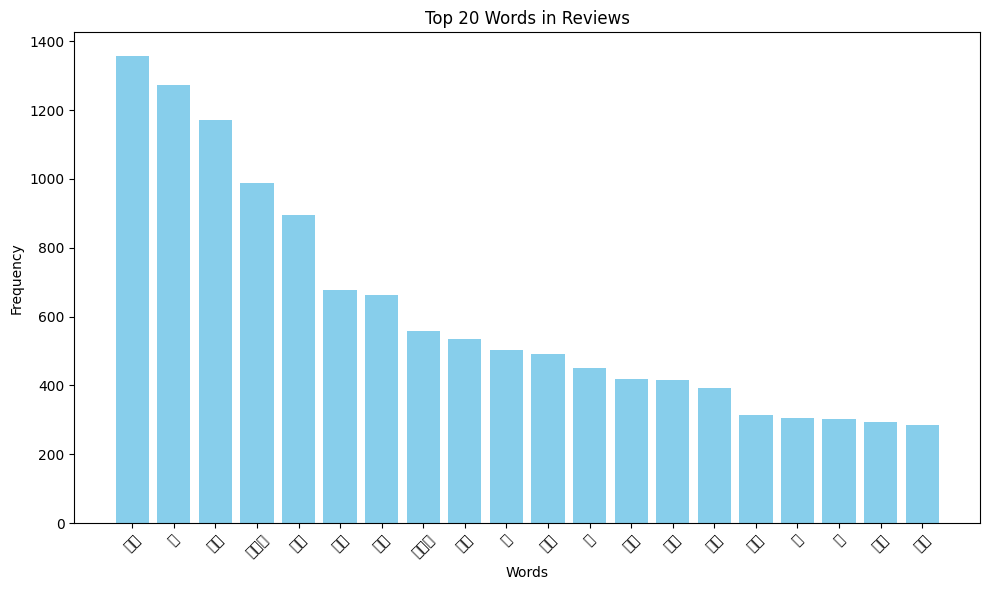

In [13]:
from matplotlib import font_manager, rc

# 나눔 폰트 설치 경로에 맞게 수정
font_path='./NanumBarunGothic.ttf'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

# 유니코드에서  음수 부호설정
plt.rcParams['axes.unicode_minus'] = False

# 단어 빈도 시각화 (막대 그래프)
plt.figure(figsize=(10, 6))
plt.bar(top_words.keys(), top_words.values(), color='skyblue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Words in Reviews')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Fo

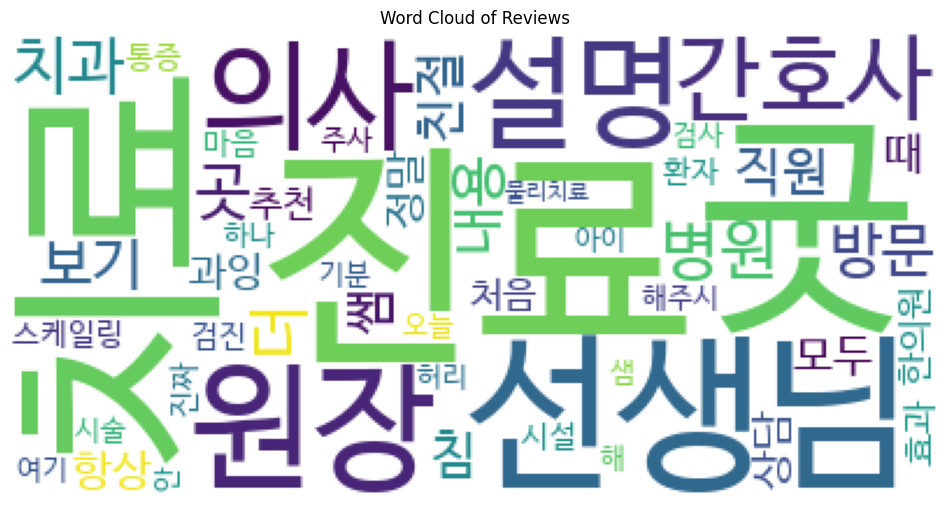

In [14]:
import matplotlib.pyplot as plt

# 워드클라우드 시각화 할 때는 이미지 시각화 함수인 imshow() 함수를 사용
figure = plt.figure(figsize=(12,12))
ax = figure.add_subplot(1,1,1)
ax.axis('off')
ax.imshow(wc)
plt.title('Word Cloud of Reviews')
plt.show()

In [15]:
df.head()

,name,content,sentiment
0,365mc모인이비인후과의원,사가정 모인 이비인후과 항상 만원이다,0
1,365mc모인이비인후과의원,좋아요,1
2,365mc모인이비인후과의원,좋아요,1
3,365mc모인이비인후과의원,항상 친절한 진료 감사합니다~,1
4,365mc모인이비인후과의원,ㅇㅇ,1


In [16]:
# 형태소 분석을 이용한 명사분석
tokenizer = Okt()
nouns = []

for review in df['content']:
    # 값이 문자열이 아니면 문자열로 변환
    if not isinstance(review, str):
        review = str(review)
        
    for noun in tokenizer.nouns(review):
        nouns.append(noun)

In [17]:
from collections import defaultdict

# 그룹화된 명사를 저장할 딕셔너리
grouped_nouns = defaultdict(list)

for index, row in df.iterrows():
    name = row['name']
    review = row['content']
    
    # 값이 문자열이 아니면 문자열로 변환
    if not isinstance(review, str):
        review = str(review)
    
    # 명사 추출 및 불용어 제거
    nouns = [noun for noun in tokenizer.nouns(review) if noun not in stopwords_list]
    
    # 그룹화된 명사 리스트에 추가
    grouped_nouns[name].extend(nouns)

# 각 그룹별로 출력
for name, nouns in grouped_nouns.items():
    print(f"Name: {name}, Nouns: {nouns}")


Name: 365mc모인이비인후과의원, Nouns: ['사가정', '이비인후과', '항상', '만원', '항상', '진료', '굿', '굿']
Name: 365서울연합의원, Nouns: ['의욕', '복', '상담', '진짜', '명의', '선생님', '설명']
Name: 88병원, Nouns: ['아유', '김용민', '원장', '신명호', '원장', '진료', '설명', '병', '대해', '설명', '일반', '병원', '입원', '실', '입원', '선물', '물통', '양치', '세트', '간식', '수건', '간호', '간병', '통합', '보호자', '병실', '면회', '스타일', '병원', '때', '허리', '보호대', '권장', '내용', '더', '보기', '명의']
Name: e-편한치과의원, Nouns: ['치료', '기간', '이제', '때', '치료', '원장', '차근차근', '설명', '해주시', '실장', '진료', '실', '해', '주시', '선생님', '봉화산역', '근처', '어금니', '금', '크라운', '처리', '믿음', '치과', '아주', '여기저기', '왜', '속']
Name: GT치과의원, Nouns: ['의사', '간호사', '친철해', '굿', '데스크', '치료', '굿', '굿', '상담']
Name: LBO산치과의원, Nouns: ['과잉', '진료', '스캘링', '검진', '건강검진', '데스크', '직원', '다리꼬', '손님', '응대', '제대로', '안함', '리가', '리가', '곳', '대기', '가라', '대기', '소변', '검사', '먼저', '정말', '다시', '곳', '내용', '더', '보기', '불친절', '굿', '치료', '마음']
Name: LBO의원, Nouns: ['진료', '설명', '곳', '자주', '이용', '설명', '진료', '실', '화목', '토', '원장', '주심', '간호사', '원장', '모두', '긴장', '덕분', '검사']
Name

In [18]:
# 그룹화된 명사를 저장할 딕셔너리
grouped_nouns = defaultdict(list)

for index, row in df.iterrows():
    name = row['name']
    review = row['content']
    
    # 값이 문자열이 아니면 문자열로 변환
    if not isinstance(review, str):
        review = str(review)
    
    # 명사 추출 및 불용어 제거
    nouns = [noun for noun in tokenizer.nouns(review) if noun not in stopwords_list]
    
    # 그룹화된 명사 리스트에 추가
    grouped_nouns[name].extend(nouns)

grouped_nouns

defaultdict(list,
            {'365mc모인이비인후과의원': ['사가정',
              '이비인후과',
              '항상',
              '만원',
              '항상',
              '진료',
              '굿',
              '굿'],
             '365서울연합의원': ['의욕', '복', '상담', '진짜', '명의', '선생님', '설명'],
             '88병원': ['아유',
              '김용민',
              '원장',
              '신명호',
              '원장',
              '진료',
              '설명',
              '병',
              '대해',
              '설명',
              '일반',
              '병원',
              '입원',
              '실',
              '입원',
              '선물',
              '물통',
              '양치',
              '세트',
              '간식',
              '수건',
              '간호',
              '간병',
              '통합',
              '보호자',
              '병실',
              '면회',
              '스타일',
              '병원',
              '때',
              '허리',
              '보호대',
              '권장',
              '내용',
              '더',
              '보기',
  

In [21]:
from collections import Counter
from wordcloud import WordCloud
import io
import base64

# 결과를 저장할 딕셔너리
grouped_top_nouns = {}

# 각 그룹별로 빈도수 측정 및 워드클라우드 생성
for name, nouns in grouped_nouns.items():
    
    # 단어 빈도수 측정
    nouns_counter = Counter(nouns)
    
    # 상위 5개 단어 추출
    top_nouns = dict(nouns_counter.most_common(50))
    
    # 빈도수가 0인 경우 처리
    if not top_nouns:
        print(f"No words for {name}")
        continue
    
    # 워드클라우드 생성
    wc = WordCloud(background_color='white', font_path='./NanumBarunGothic.ttf')
    wc.generate_from_frequencies(top_nouns)

    # 워드클라우드 이미지를 바이트로 변환
    image_bytes = io.BytesIO()
    wc.to_image().save(image_bytes, format='PNG')
    image_bytes = image_bytes.getvalue()

    # 바이너리 데이터를 base64로 인코딩
    image_base64 = base64.b64encode(image_bytes).decode('utf-8')
    
    # 결과 저장
    grouped_top_nouns[name] = {
        'top_nouns': top_nouns,
        'wordcloud_image_base64': image_base64  # wc 대신에 이미지 데이터를 저장
    }

grouped_top_nouns

# # 결과 출력 또는 저장
# for name, result in grouped_top_nouns.items():
#     print(f"Name: {name}, Top Nouns: {result['top_nouns']}")
    
#     # 워드클라우드 표시
#     plt.figure(figsize=(10, 6))
#     plt.imshow(result['wordcloud'], interpolation='bilinear')
#     plt.axis("off")
#     plt.title(f"Word Cloud for {name}")
#     plt.show()

No words for 경희솔한의원
No words for 녹색병원 응급실
No words for 망우기독의원
No words for 면목의원
No words for 백세마취통증의학과의원
No words for 서울라본병원 신관
No words for 서울신내의원
No words for 서울우리정형외과의원
No words for 서울이다움치과의원 디지털임플란트 클리닉
No words for 수목한의원
No words for 주정형외과의원
No words for 태온한의원
No words for 한치과의원


{'365mc모인이비인후과의원': {'top_nouns': {'항상': 2,
   '굿': 2,
   '사가정': 1,
   '이비인후과': 1,
   '만원': 1,
   '진료': 1},
  'wordcloud_image_base64': 'iVBORw0KGgoAAAANSUhEUgAAAZAAAADICAIAAABJdyC1AABC4klEQVR4nO2dd5xTxfbA57b0Xrb3Ql16X6QpRcECKhYQwa7P9uwF9eezvGd7+hRs2BHhiYoID0UBQXoRlrK0ZXvfTdv0dsvvj2CMSW42u7nJTZb7/eDnM5mZO3OyJiczZ86cA1EUBTg4ODhSAZRtATg4OC5czI4fra5dvrJWehsfK4ncn1NYHBx9B6NtTZPx8ej7Zytf1EiXxE2c7rF7Dhtsq3xluWg2p7A4UhKKch9vOv/ZRWHl4JzjST41ReFW13az8xeHuwIndARlRWE1hmRKBRfJRLNEvGE9nZqH5gzM2te7t9CH4RQWB/O4vGdN9m+trj1eoo0kbRiSyceKFaIr5aJLYUjItnTM0+XY0Nb1qgdvDKz0Eu1eot3hqeiwLJMILspUPCXiDWVLwj4Dp7A4mIQgzS2m50z2dYGVbrzOjddZnFvRLm2O6hW5cCZT07m8ZxzuCl+Zj5WI+WMi97c4t+KEzleWi65AYEmMAlCUt9n4pNG+NnI3m2t3dftVWcrnNdLFMc7ILjWdN9pcu3v9eJ76baX46lgE4BQWB2N48Ibqjvleoo2uA07o6nW3aWV3ZSmeYWRGq/O31q6XfGW15KZuFVan5T27+5CvLBZMiFlhkfX6Oy3OrdF0pQDeYnqGpCxpsvtjmzQSKsmNKsmN8Rs/RiAIi3EETmFxMIOX6KzpvDGCtvKjs3yIQLJ0+QMJkCqutHW9EaitIIAoxVcrxPOEvEEIJCdIk91zxGRba3b+EviIABssE14c++yVzYMI0hr7OKHEz2gIQfwYR+AUFgczNBke9uBN/pci3vA02T0i

In [22]:
import json

file_path = 'grouped_top_nouns.json'
with open(file_path, 'w') as f:
    json.dump(grouped_top_nouns, f)

findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
c:\Users\user\Desktop\saltlux_project\.venv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 48337 (\N{HANGUL SYLLABLE BYEONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
fin

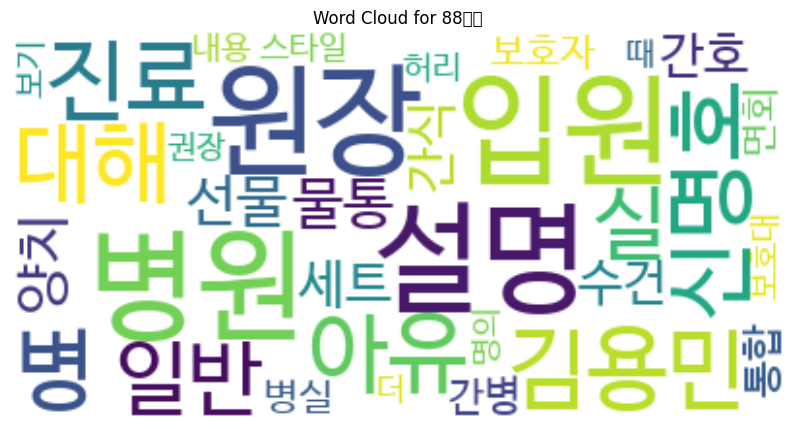

findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_19140\2435157856.py:26: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  plt.tight_layout()
C:\Users\user\AppData\Local\Temp\ipykernel_19140\2435157856.py:26: UserWarning: Glyph 51109 (\N{HANGUL SYLLABLE JANG}) missing from current font.
  plt.tight_layout()
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_19140\2435157856.py:26: UserWarning: Glyph 49444 (\N{HANGUL SYLLABLE SEOL}) missing from current font.
  plt.tight_layout()
C:\Users\user\AppData\Local\Temp\ipykernel_19140\2435157856.py:26: UserWarning: Glyph 47749 (\N{HANGUL SYLLABLE MYEONG}) missing from current font.
  plt.tight_layout()
findfont: Font family 'NanumBarunGothic' not found.
C:\Users\user\AppData\Local\Temp\ipykernel_19140\2435157856.py:26: UserWarning: Glyph 48337 (\N{HANGUL SYLLABLE BYEONG}) m

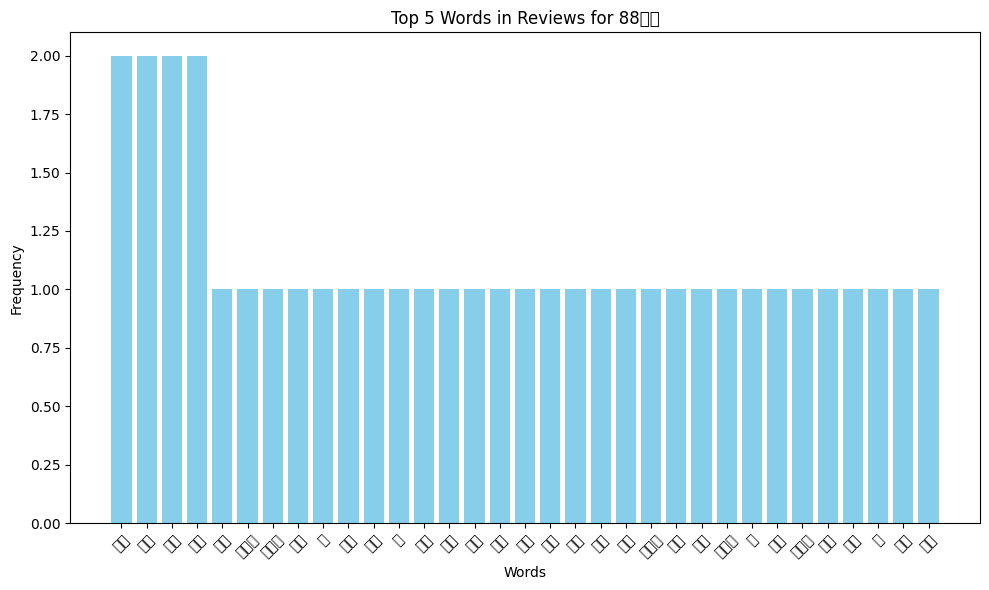

In [43]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud_and_top5(grouped_top_nouns, hospital_name):
    if hospital_name not in grouped_top_nouns:
        print(f"No data available for {hospital_name}")
        return

    # 워드클라우드
    wc = grouped_top_nouns[hospital_name]['wordcloud']
    plt.figure(figsize=(10, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for {hospital_name}")
    plt.show()

    # 상위 5개 그래프
    top_nouns = grouped_top_nouns[hospital_name]['top_nouns']
    plt.figure(figsize=(10, 6))
    plt.bar(top_nouns.keys(), top_nouns.values(), color='skyblue')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Top 5 Words in Reviews for {hospital_name}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 예시로 'Hospital_A'에 대한 결과 보기
show_wordcloud_and_top5(grouped_top_nouns, '88병원')
